<a href="https://colab.research.google.com/github/taras-musakovskyi/colab-jupyter-fish-models/blob/main/high_res_fish_inpaint_to_generated_upscaled_tuned.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# ======================================================================
# CELL 1: Setup and Imports
# ======================================================================
!pip install -q \
  "torch" \
  "diffusers==0.27.2" \
  "transformers==4.40.2" \
  "accelerate==0.28.0" \
  "safetensors" \
  "peft==0.10.0" \
  "huggingface_hub==0.23.0" \
  "pillow" \
  "google-api-python-client"

import io, os, json, random, shutil, torch
from googleapiclient.discovery import build
from googleapiclient.http import MediaIoBaseDownload
from diffusers import StableDiffusionInpaintPipeline, EulerAncestralDiscreteScheduler
from peft import PeftModel
from PIL import Image, ImageDraw, ImageFilter

from google.colab import auth

device = "cuda" if torch.cuda.is_available() else "cpu"
print("device:", device)

# ======================================================================
# CELL 2: Download base image and LoRA from Google Drive
# ======================================================================
# User must set file IDs here:
BASE_IMAGE_FILE_ID = "1U3k7ytnZxLQCZEaIc2nElEGSR54kyAr5"   # shutterstock_1141039277.jpg
LORA_FILE_ID = "1raH1cOdNGIJZ5xMX925NbTHPuBuDXG7H"         # back_up_this_one_lora_1b_best_epoch_24_20251006_121339

auth.authenticate_user()
drive_service = build('drive', 'v3')

base_image_path = "/content/base_image.png"
fish_lora_path = "/content/fish_lora.safetensors"

def download_from_gdrive(file_id, filename):
    request = drive_service.files().get_media(fileId=file_id)
    with open(filename, "wb") as f:
        downloader = MediaIoBaseDownload(f, request)
        done = False
        while not done:
            status, done = downloader.next_chunk()
    print(f"Downloaded: {filename}")

download_from_gdrive(BASE_IMAGE_FILE_ID, "base_image.png")
download_from_gdrive(LORA_FILE_ID, "fish_lora.safetensors")

# ======================================================================
# CELL 3: Load pipeline with fish LoRA
# ======================================================================
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_FILE = fish_lora_path

pipe = StableDiffusionInpaintPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    safety_checker=None
)
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)

# Attach LoRA
ad = "/tmp/lora_adapter"
shutil.rmtree(ad, ignore_errors=True)
os.makedirs(ad, exist_ok=True)
shutil.copy(LORA_FILE, os.path.join(ad, "adapter_model.safetensors"))
adapter_config = {
    "base_model_name_or_path": MODEL_NAME,
    "peft_type": "LORA",
    "r": 32,
    "lora_alpha": 64,
    "target_modules": ["to_k", "to_q", "to_v", "to_out.0"],
    "lora_dropout": 0.1
}
with open(os.path.join(ad, "adapter_config.json"), "w") as f:
    json.dump(adapter_config, f, indent=2)

pipe.unet = PeftModel.from_pretrained(
    pipe.unet, ad, adapter_name=os.path.splitext(os.path.basename(LORA_FILE))[0]
)
pipe = pipe.to(device)
print("LoRA attached successfully")



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.0/138.0 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 54.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.0/9.0 MB 72.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.1/290.1 kB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.1/199.1 kB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 401.2/401.2 kB 18.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 36.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
sentence-transformers 5.1.1 requires transformers<5.0.0,>=4.41.0, but you have transformers 4.40.2 which is incompatible.
gradio 5.49.0 requires huggingface-hub<2.0,>=0.33.5, but you have huggingface-hub 0.23.0 which is incompatible.
datasets 4.0.0 requires huggingface-

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

device: cuda
Downloaded: base_image.png
Downloaded: fish_lora.safetensors


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


LoRA attached successfully


In [2]:
# ============================================================================
# CELL: Generate Base Apartment Image using Underwater LoRA (SD 1.5)
# ============================================================================

import os, random, torch, shutil, json
from diffusers import StableDiffusionPipeline, EulerAncestralDiscreteScheduler
from peft import PeftModel
from PIL import Image
from googleapiclient.http import MediaIoBaseDownload
import io

# --- Configuration ---
MODEL_NAME = "runwayml/stable-diffusion-v1-5"
LORA_MODEL_FILE_ID = "1Lm69A3BN5ixhiFIz4bXYiNOc6CzK0ypt"  # underwater_lora_best_epoch_43
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
OUTPUT_PATH = "/content/base_image.png"
SEED = random.randint(0, 2**31 - 1)

print("="*80)
print("📥 STEP 1: Downloading Underwater Apartment LoRA from Google Drive...")
print("="*80)

lora_path = "/content/underwater_apartment_lora.safetensors"

if not os.path.exists(lora_path):
    request = drive_service.files().get_media(fileId=LORA_MODEL_FILE_ID)
    with io.FileIO(lora_path, "wb") as fh:
        downloader = MediaIoBaseDownload(fh, request)
        done = False
        while not done:
            status, done = downloader.next_chunk()
            print(f"  Download progress: {int(status.progress() * 100)}%", end="\r")
    print(f"\n✅ Downloaded LoRA to: {lora_path}")
else:
    print(f"ℹ️ Using existing LoRA file: {lora_path}")

print("="*80)
print("🧩 STEP 2: Loading Stable Diffusion Pipeline...")
print("="*80)

pipe_underwater = StableDiffusionPipeline.from_pretrained(
    MODEL_NAME,
    torch_dtype=torch.float16 if DEVICE == "cuda" else torch.float32,
    safety_checker=None
)
pipe_underwater.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe_underwater.scheduler.config)
pipe_underwater = pipe_underwater.to(DEVICE)

# --- Apply LoRA ---
print("\n🔧 Applying LoRA weights...")

adapter_dir = "/tmp/lora_adapter_apt"
shutil.rmtree(adapter_dir, ignore_errors=True)
os.makedirs(adapter_dir, exist_ok=True)
shutil.copy(lora_path, os.path.join(adapter_dir, "adapter_model.safetensors"))

adapter_config = {
    "base_model_name_or_path": MODEL_NAME,
    "peft_type": "LORA",
    "r": 32,
    "lora_alpha": 64,
    "target_modules": ["to_k", "to_q", "to_v", "to_out.0"],
    "lora_dropout": 0.1
}

with open(os.path.join(adapter_dir, "adapter_config.json"), "w") as f:
    json.dump(adapter_config, f, indent=2)

pipe_underwater.unet = PeftModel.from_pretrained(pipe_underwater.unet, adapter_dir, adapter_name="underwater_apartment")
print("✅ LoRA applied successfully.\n")

print("="*80)
print("🎨 STEP 3: Generating Apartment Image...")
print("="*80)

prompts = [
    "underwater living room with light caustics on walls, blue tinted lighting, bubbles floating",
    "flooded office with desk and chair, underwater atmosphere, water effects",
    "flooded home office workspace, underwater atmosphere, water effects, aquatic environment"
  ]
prompt = random.choice(prompts)
negative_prompt = "blurry, low quality, distorted, cartoon, multiple rooms, cropped"

print(f"🖼️  Selected prompt: {prompt}")
print(f"🎲  Seed: {SEED}")

generator = torch.Generator(device=DEVICE).manual_seed(SEED)

image = pipe_underwater(
    prompt=prompt,
    negative_prompt=negative_prompt,
    num_inference_steps=30,
    guidance_scale=7.0,
    generator=generator
).images[0]

print("\n✅ Generation complete. Original size:", image.size)

# temp fix - data augmentation issue for underwater lora, remove black borders
w, h = image.size
crop_px_w = int(w * 0.02)
crop_px_h = int(h * 0.02)
image = image.crop((crop_px_w, crop_px_h, w - crop_px_w, h - crop_px_h))

# --- Resize to target resolution ---
target_size = (2700, 1600)
#image = image.resize(target_size, Image.LANCZOS)
from diffusers import StableDiffusionUpscalePipeline
import torch

pipeUpscale = StableDiffusionUpscalePipeline.from_pretrained(
    "stabilityai/stable-diffusion-x4-upscaler",
    torch_dtype=torch.float16
).to("cuda")

# make it rectangular (1.5x512, 512) first with PIL resize:
image = image.resize((768, 512), Image.LANCZOS)

# Upscale with img2img
pipeUpscale.enable_attention_slicing()
pipeUpscale.enable_vae_tiling()
image = pipeUpscale(
    prompt=prompt, #same prompt as used for generating the base image
    image=image,
    #strength=0.3,  # low strength preserves original
    num_inference_steps=12
).images[0]

print(f"🔧 Resized to: {target_size}")

image.save(OUTPUT_PATH)
print(f"💾 Saved to: {OUTPUT_PATH}")
print("="*80)
print("✅ Apartment base image generation complete — ready for inpainting.")
print("="*80)


📥 STEP 1: Downloading Underwater Apartment LoRA from Google Drive...
  Download progress: 100%
✅ Downloaded LoRA to: /content/underwater_apartment_lora.safetensors
🧩 STEP 2: Loading Stable Diffusion Pipeline...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .



🔧 Applying LoRA weights...
✅ LoRA applied successfully.

🎨 STEP 3: Generating Apartment Image...
🖼️  Selected prompt: flooded home office workspace, underwater atmosphere, water effects, aquatic environment
🎲  Seed: 803327874


  0%|          | 0/30 [00:00<?, ?it/s]


✅ Generation complete. Original size: (512, 512)


model_index.json:   0%|          | 0.00/485 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/634 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/300 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/348 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer_config.json:   0%|          | 0.00/825 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/982 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/587 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.89G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/221M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/12 [00:00<?, ?it/s]

🔧 Resized to: (2700, 1600)
💾 Saved to: /content/base_image.png
✅ Apartment base image generation complete — ready for inpainting.


Original size: 3072x2048
seed: 2107384804


  0%|          | 0/50 [00:00<?, ?it/s]

Saved /content/inpainted_final.png


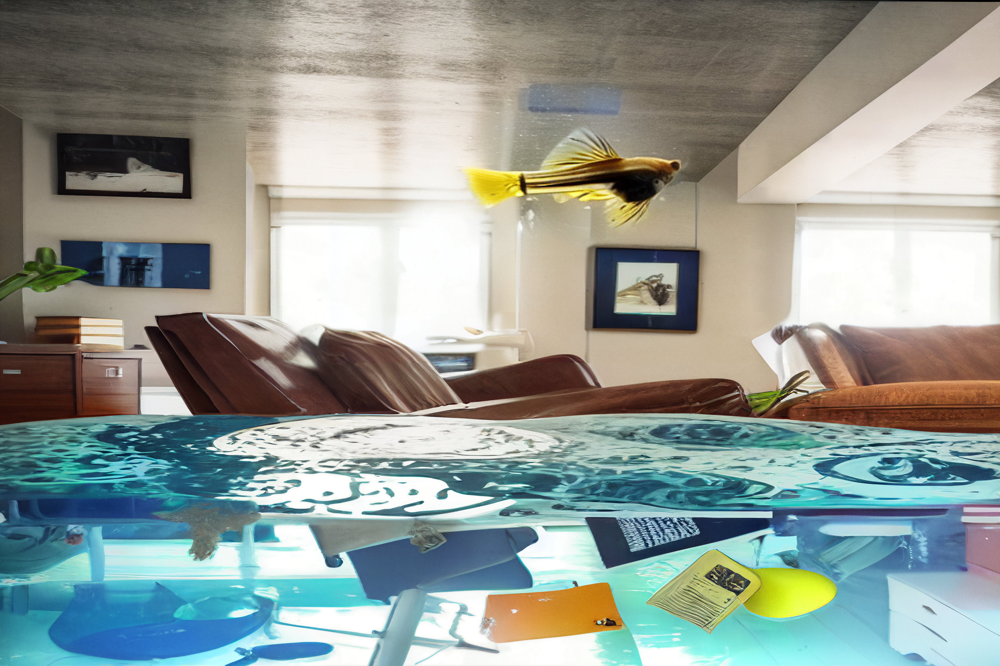

In [6]:
# ======================================================================
# CELL 4: Localized Inpainting Region logic
# ======================================================================
def floor_to_multiple(x, m=8):
    return (x // m) * m

# Load full image
init_image = Image.open(base_image_path).convert("RGB")
w, h = init_image.size
print(f"Original size: {w}x{h}")

mask_image = Image.new("L", (w, h), 0)
draw = ImageDraw.Draw(mask_image)
#1024 * 1.2 for gold fish
#512 * 1.37 for gold molly
mask_h = 512
mask_w = int(mask_h * 1.44)#$45)#1)#.356)
cx = random.randint(mask_w // 2, w - mask_w // 2)
cy = random.randint(mask_h // 2, h - mask_h // 2)
draw.ellipse(
    [cx - mask_w // 2, cy - mask_h // 2, cx + mask_w // 2, cy + mask_h // 2],
    fill=225#was 255, try 235 for all, 225 for gupies
)
blur_radius = int(mask_w * 0.08)#base is 0.08
mask_image = mask_image.filter(ImageFilter.GaussianBlur(blur_radius))

mask_image.save("/content/mask_full.png")

# --- Determine crop box (slightly larger than mask) ---
pad = int(mask_w * 0.5) #0.4 tested ok for gold, 0.5 - for molly
x0 = max(0, cx - mask_w // 2 - pad)
y0 = max(0, cy - mask_h // 2 - pad)
x1 = min(w, cx + mask_w // 2 + pad)
y1 = min(h, cy + mask_h // 2 + pad)

crop_box = (x0, y0, x1, y1)
region = init_image.crop(crop_box)
region_mask = mask_image.crop(crop_box)

# Resize region + mask to 512×512 for LoRA input
region_small = region.resize((512, 512), Image.LANCZOS)
mask_small = region_mask.resize((512, 512), Image.LANCZOS)

# --- Run inpainting on local region ---
PROMPT = "a complete single guppy fish with head, body and tail visible, full fish from head to tail, highly detailed, colorful tale, in clear water, sharp focus"
#"a beautiful black molly fish swimming in clear aquarium water, ultra detailed scales and fins, sharp, high resolution"
NEGATIVE = (
    "multiple fish, duplicate, extra eyes, multiple eyes, double eyes, four eyes, "
          "deformed eyes, extra fins, multiple fins, duplicate fins, mutated, distorted, "
          "disfigured, malformed, duplicate body parts, motion blur, blurry, smooth, "
          "headless, no head, missing head, cropped head, decapitated, partial fish, cut off "
          "cropped, partial, cut off, incomplete, half fish, head only, tail only, body cut, edge of frame"
          "plastic, metallic, aquarium glass, ribbed glass"
)
seed = random.randint(0, 2**31 - 1)
generator = torch.Generator(device=device).manual_seed(seed)
print("seed:", seed)

out_small = pipe(
    prompt=PROMPT,
    negative_prompt=NEGATIVE,
    image=region_small,
    mask_image=mask_small,
    num_inference_steps=50,
    guidance_scale=9.5, #base is 6.5, for guppies need higher
    generator=generator
).images[0]

# --- Resize inpainted region back and reinsert into original ---
out_large = out_small.resize(region.size, Image.LANCZOS)
final_image = init_image.copy()
final_image.paste(out_large, crop_box)

# ======================================================================
# CELL 5: Save and Display
# ======================================================================
init_image.save("/content/original.png")
final_image.save("/content/inpainted_final.png")
print("Saved /content/inpainted_final.png")

from IPython.display import display
#display(init_image)
display(final_image)
